In [2]:
import pandas as pd
import numpy as np

# === Train set ===
df_LTrain_x = pd.read_csv('arkomadataset/LeftArmDataset/LTrain_x.csv')
df_LTrain_y = pd.read_csv('arkomadataset/LeftArmDataset/LTrain_y.csv')

# === Validation set ===
df_LVal_x = pd.read_csv('arkomadataset/LeftArmDataset/LVal_x.csv')
df_LVal_y = pd.read_csv('arkomadataset/LeftArmDataset/LVal_y.csv')

# === Test set ===
df_LTest_x = pd.read_csv('arkomadataset/LeftArmDataset/LTest_x.csv')
df_LTest_y = pd.read_csv('arkomadataset/LeftArmDataset/LTest_y.csv')

# Just to see how many rows/columns you have
print("Train X shape:", df_LTrain_x.shape)
print("Train Y shape:", df_LTrain_y.shape)
print("Validation X shape:", df_LVal_x.shape)
print("Validation Y shape:", df_LVal_y.shape)
print("Test X shape:", df_LTest_x.shape)
print("Test Y shape:", df_LTest_y.shape)


Train X shape: (6000, 6)
Train Y shape: (6000, 5)
Validation X shape: (2000, 6)
Validation Y shape: (2000, 5)
Test X shape: (2000, 6)
Test Y shape: (2000, 5)


In [3]:
X_train = df_LTrain_x.values
y_train = df_LTrain_y.values

X_val = df_LVal_x.values
y_val = df_LVal_y.values

X_test = df_LTest_x.values
y_test = df_LTest_y.values

In [4]:
from sklearn.preprocessing import StandardScaler

# Create scalers for inputs and outputs
scaler_X = StandardScaler()
scaler_y = StandardScaler()
print(scaler_y)
# Fit scalers only on the training data and transform training, validation, and test sets:
X_train_scaled = scaler_X.fit_transform(X_train)
X_val_scaled = scaler_X.transform(X_val)
X_test_scaled = scaler_X.transform(X_test)

print("werwer",X_train[0], X_test_scaled[0])

y_train_scaled = scaler_y.fit_transform(y_train)
y_val_scaled = scaler_y.transform(y_val)
y_test_scaled = scaler_y.transform(y_test)

print("Sample normalized input:", X_train_scaled[0])
print("Sample normalized output:", y_train_scaled[0])

StandardScaler()
werwer [-27.92 182.21 -69.34  -7.65 101.56   8.92] [ 0.90805069  0.57997703 -0.58642798 -2.52569467 -0.3375452   1.22392449]
Sample normalized input: [-1.66424774  0.04971416 -1.27395635 -0.0678829   1.86054145  0.13048967]
Sample normalized output: [ 1.23094922  0.60199925  0.84784477 -0.60489306 -0.75798009]


In [6]:
!pip install keras_tuner

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 9.6 MB/s eta 0:00:00


In [7]:
import tensorflow as tf
from tensorflow import keras
import keras_tuner as kt

def build_model(hp):
    model = keras.Sequential()
    # Tune number of units in first and second dense layers:
    units = hp.Int('units', min_value=32, max_value=256, step=32)
    model.add(keras.layers.Dense(units, activation='relu',
                                 input_shape=(X_train_scaled.shape[1],)))
    # Tune dropout rate:
    model.add(keras.layers.Dropout(hp.Float('dropout', 0.1, 0.5, step=0.1)))
    model.add(keras.layers.Dense(units, activation='relu'))
    # Final regression output:
    model.add(keras.layers.Dense(y_train_scaled.shape[1], activation='linear'))
    # Tune optimizer choice and learning rate:
    optimizer = hp.Choice('optimizer', ['adam', 'rmsprop', 'sgd'])
    lr = hp.Float('learning_rate', 1e-4, 1e-2, sampling='log')
    model.compile(
        optimizer=keras.optimizers.get({'class_name': optimizer, 'config': {'learning_rate': lr}}),
        loss='mse',
        metrics=['mae']
    )
    return model


In [8]:
tuner = kt.BayesianOptimization(
    hypermodel=build_model,
    objective='val_loss',
    max_trials=20,
    directory='tuner_dir',
    project_name='regression_bayesopt'
)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [9]:
stop_early = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)
tuner.search(
    X_train_scaled, y_train_scaled,
    epochs=100,
    validation_data=(X_val_scaled, y_val_scaled),
    callbacks=[stop_early],
    batch_size=64,
    shuffle=True
)


Trial 20 Complete [00h 00m 59s]
val_loss: 0.0811840146780014

Best val_loss So Far: 0.04224998131394386
Total elapsed time: 00h 13m 16s


In [11]:
best_hp = tuner.get_best_hyperparameters(num_trials=1)[0]
print("Optimal units:", best_hp.get('units'))
print("Optimal dropout:", best_hp.get('dropout'))
print("Optimal optimizer:", best_hp.get('optimizer'))
print("Optimal learning rate:", best_hp.get('learning_rate'))


Optimal units: 192
Optimal dropout: 0.2
Optimal optimizer: adam
Optimal learning rate: 0.001165386407610881


In [12]:
# Build model with optimal hyperparameters
model = build_model(best_hp)
history = model.fit(
    X_train_scaled, y_train_scaled,
    epochs=100,
    validation_data=(X_val_scaled, y_val_scaled),
    batch_size=64,
    callbacks=[stop_early],
    shuffle=True
)

Epoch 1/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - loss: 0.5993 - mae: 0.5913 - val_loss: 0.3303 - val_mae: 0.4116
Epoch 2/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3314 - mae: 0.4096 - val_loss: 0.2143 - val_mae: 0.3047
Epoch 3/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.2431 - mae: 0.3403 - val_loss: 0.1803 - val_mae: 0.2704
Epoch 4/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.2138 - mae: 0.3148 - val_loss: 0.1539 - val_mae: 0.2406
Epoch 5/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1911 - mae: 0.2932 - val_loss: 0.1400 - val_mae: 0.2246
Epoch 6/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.1648 - mae: 0.2690 - val_loss: 0.1289 - val_mae: 0.2157
Epoch 7/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.1576 - mae: 0.2651 - val_loss: 0.1155 - val_mae: 0.2023
Epoch 8/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1438 - mae: 0.2502 - val_loss: 0.1065 - val_mae: 0.1861
Epoch 9/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.13

In [13]:
test_loss, test_mae = model.evaluate(X_test_scaled, y_test_scaled)
print("Test MSE:", test_loss)
print("Test MAE:", test_mae)

63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0586 - mae: 0.1386
Test MSE: 0.04872565716505051
Test MAE: 0.12543974816799164


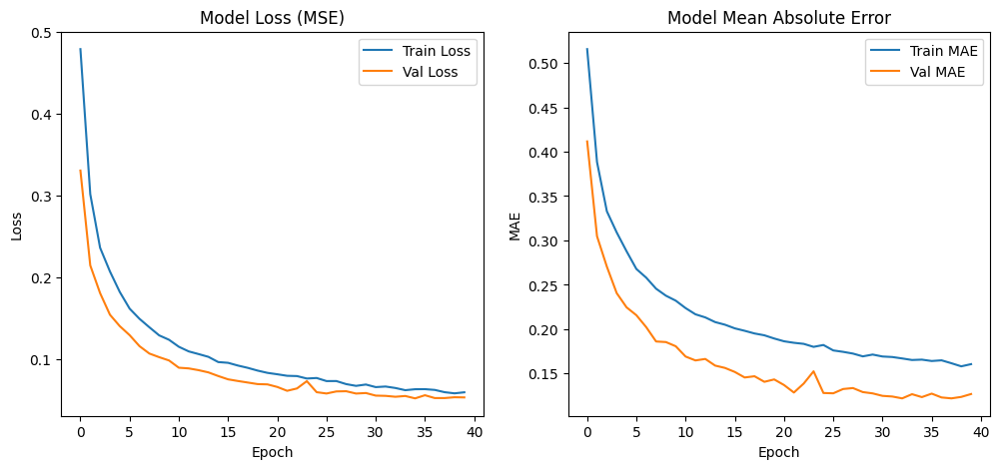

In [14]:
import matplotlib.pyplot as plt

# Plot training & validation loss values
plt.figure(figsize=(12,5))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Model Loss (MSE)')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['mae'], label='Train MAE')
plt.plot(history.history['val_mae'], label='Val MAE')
plt.title('Model Mean Absolute Error')
plt.xlabel('Epoch')
plt.ylabel('MAE')
plt.legend()

plt.show()

In [15]:
import numpy as np

def forward_kinematics(joint_angles, link_lengths):
    """
    Computes the positions of each joint in a simple 3D robotic arm.

    Parameters:
        joint_angles: list or array of 3 angles [theta1, theta2, theta3]
        link_lengths: list or array of link lengths [l1, l2, l3]

    Returns:
        positions: A numpy array of shape (4, 3) where each row is [x, y, z]
                   starting from the base to the end-effector.
    """
    # Base position
    x0, y0, z0 = 0, 0, 0
    positions = [(x0, y0, z0)]

    # First joint: rotates in the XY plane
    theta1 = joint_angles[0]
    x1 = x0 + link_lengths[0] * np.cos(theta1)
    y1 = y0 + link_lengths[0] * np.sin(theta1)
    z1 = z0
    positions.append((x1, y1, z1))

    # Second joint: introduces vertical motion (rotation around y-axis)
    theta2 = joint_angles[1]
    x2 = x1 + link_lengths[1] * np.cos(theta1) * np.cos(theta2)
    y2 = y1 + link_lengths[1] * np.sin(theta1) * np.cos(theta2)
    z2 = z1 + link_lengths[1] * np.sin(theta2)
    positions.append((x2, y2, z2))

    # Third joint: adds another rotation (around y-axis) for demonstration
    theta3 = joint_angles[2]
    x3 = x2 + link_lengths[2] * np.cos(theta1) * np.cos(theta2 + theta3)
    y3 = y2 + link_lengths[2] * np.sin(theta1) * np.cos(theta2 + theta3)
    z3 = z2 + link_lengths[2] * np.sin(theta2 + theta3)
    positions.append((x3, y3, z3))

    return np.array(positions)

In [16]:
# Generate a sequence of NN predictions from the test set (assuming at least 100 samples are present)
num_frames = 100
angles_sequence_nn = []

for i in range(num_frames):
    # Get one test sample (reshape as a single-sample batch)
    x_input = X_test_scaled[i].reshape(1, -1)
    # Predict the joint angles (scaled)
    pred_scaled = model.predict(x_input)
    # Inverse-transform to get back to the original scale
    pred = scaler_y.inverse_transform(pred_scaled)[0]
    # Use only the first three joint angles for our 3D demonstration
    joint_angles = pred[:3]
    angles_sequence_nn.append(joint_angles)

angles_sequence_nn = np.array(angles_sequence_nn)
print("NN-generated angles sequence shape:", angles_sequence_nn.shape)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━

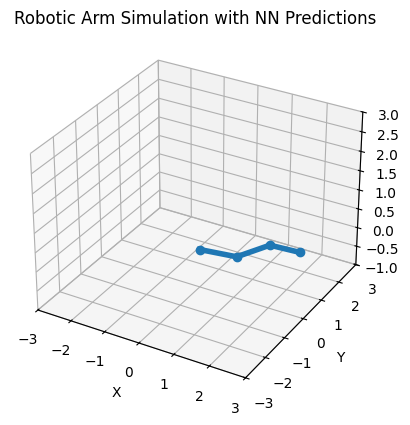

In [17]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.animation as animation

# Define the arm's link lengths (adjust these for your arm's geometry)
link_lengths = [1.0, 1.0, 0.8]

# Set up the 3D plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.set_xlim([-3, 3])
ax.set_ylim([-3, 3])
ax.set_zlim([-1, 3])
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title("Robotic Arm Simulation with NN Predictions")

# Initialize line for the arm (we'll update its data in the animation)
line, = ax.plot([], [], [], 'o-', lw=4)

# Initialization function for the animation
def init():
    line.set_data([], [])
    line.set_3d_properties([])
    return (line,)

# Animation function which updates the arm position using NN predictions
def animate(i):
    joint_angles = angles_sequence_nn[i]   # Get predicted joint angles for frame i
    positions = forward_kinematics(joint_angles, link_lengths)
    xs = positions[:, 0]
    ys = positions[:, 1]
    zs = positions[:, 2]

    line.set_data(xs, ys)
    line.set_3d_properties(zs)
    return (line,)

# # Create the animation
# ani = animation.FuncAnimation(fig, animate, frames=len(angles_sequence_nn),
#                               init_func=init, blit=True, interval=50)

# plt.show()


from IPython.display import HTML
from matplotlib import rc

rc('animation', html='jshtml')  # or use 'html5' if preferred

ani = animation.FuncAnimation(fig, animate, frames=len(angles_sequence_nn),
                              init_func=init, blit=True, interval=50)

HTML(ani.to_jshtml())


# from matplotlib.animation import PillowWriter

# # Create the animation
# ani = animation.FuncAnimation(fig, animate, frames=len(angles_sequence_nn),
#                               init_func=init, blit=True, interval=50)

# # Save the animation as a GIF
# ani.save('robotic_arm_200epoch_64batchsize.gif', writer=PillowWriter(fps=20))